<a href="https://colab.research.google.com/github/paulopestanaj/infnet-bootcamp/blob/master/Waffle_%7C_WordCloud_%7C_Folium.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Waffle | WordClouds | Folium

Pra realizar esse exemplo, vou utilizar o dataset do airbnb do Rio de Janeiro do site. 

(http://insideairbnb.com/get-the-data.html) arquivo 'listings.csv'

In [ ]:
# instalar wordcloud
!pip install wordcloud -q

# instalar o pywaffle
!pip install pywaffle -q

In [127]:
# importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from pywaffle import Waffle
import folium

### importando dados do airbnb

In [128]:
df = pd.read_csv('http://data.insideairbnb.com/brazil/rj/rio-de-janeiro/2021-02-22/visualisations/listings.csv')

In [129]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,17878,"Very Nice 2Br in Copacabana w. balcony, fast WiFi",68997,Matthias,NaN,Copacabana,-22.96592,-43.17896,Entire home/apt,221,5,260,2021-02-08,2.01,1,304
1,24480,Nice and cozy near Ipanema Beach,99249,Goya,NaN,Ipanema,-22.98570,-43.20193,Entire home/apt,307,3,85,2018-02-14,0.67,1,10
2,25026,Beautiful Modern Decorated Studio in Copa,3746246,Ghizlane,NaN,Copacabana,-22.97712,-43.19045,Entire home/apt,160,7,238,2020-02-15,1.82,11,328
3,35636,Cosy flat close to Ipanema beach,153232,Patricia,NaN,Ipanema,-22.98816,-43.19359,Entire home/apt,273,2,181,2020-03-15,2.02,1,207
4,35764,COPACABANA SEA BREEZE - RIO - 20 X Superhost,153691,Patricia Miranda & Paulo,NaN,Copacabana,-22.98127,-43.19046,Entire home/apt,135,3,353,2021-02-10,2.79,1,101


### Separando somente as variaveis que vou utilizar

In [ ]:
df = df[['name', 'longitude','latitude','room_type']]

In [ ]:
df.head()

,name,longitude,latitude,room_type
0,"Very Nice 2Br in Copacabana w. balcony, fast WiFi",-43.17896,-22.96592,Entire home/apt
1,Nice and cozy near Ipanema Beach,-43.20193,-22.98570,Entire home/apt
2,Beautiful Modern Decorated Studio in Copa,-43.19045,-22.97712,Entire home/apt
3,Cosy flat close to Ipanema beach,-43.19359,-22.98816,Entire home/apt
4,COPACABANA SEA BREEZE - RIO - 20 X Superhost,-43.19046,-22.98127,Entire home/apt


## Waffle

Iremos utilizar a biblioteca pywaffle (https://github.com/gyli/PyWaffle)

Quero tirar meu grafico de waffle da variavel room_type, para isso vou transformar os totais de cada atributo num dicionário, para passar para meu grafico

In [ ]:
# extrair value counts da variavel room type
data = df.room_type.value_counts().to_dict()

In [ ]:
data

{'Entire home/apt': 19285,
 'Hotel room': 99,
 'Private room': 6619,
 'Shared room': 612}

O `pywaffle` é altamente customizado e aceita os ícones da [Font Awesome](http://fontawesome.io/).


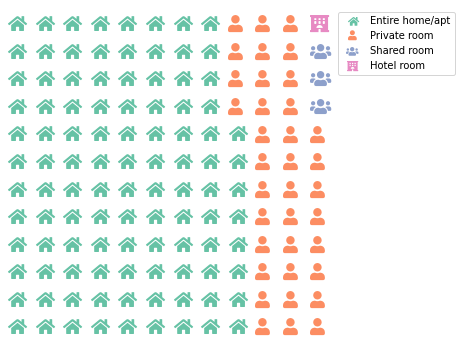

In [ ]:
# plotar gráfico de waffle
fig = plt.figure(
                FigureClass=Waffle,                            ## definindo meu tipo de gráfico
                rows=12,                                        
                columns=12,
                icons=['home', 'user', 'users', 'hotel'],
                values=data,
                legend={'loc': 'upper left', 'bbox_to_anchor': (1,1)},
                icon_legend=True,
                figsize=(8,6)
                )
fig.set_tight_layout(False)
plt.show();

## WordCloud

Para a nuvem, vou utilizar a variável nome e para isso vou, vou concatenar todas as strings, como se fosse uma linha única.
Também já vou deletar os valores nulos.

In [ ]:
names = df.dropna(subset=['name'], axis=0)['name']

In [ ]:
# concatenar as palavras
all_names = " ".join(s for s in names)

In [ ]:
all_names

'Very Nice 2Br in Copacabana w. balcony, fast WiFi Nice and cozy near Ipanema Beach Beautiful Modern Decorated Studio in Copa Cosy flat close to Ipanema beach COPACABANA SEA BREEZE  -  RIO - 20 X Superhost Modern 2bed,Top end of Copacabana Beach Block 6bed Penthouse, Ipanema Best Location! Confortable 4BD 3.5BT Atlantic avenue Djalma Ocean View Studio with Amazing Views #100A Beach Block Suites in Ipanema Best Location 4 Suites lake front Barra da Tijuca Ocean view, block of the beach, Copacabana,Ipanema Ipanema amazing 3 BDRs apartment. Beach Block 3bed Penthouse, Ipanema Best Location! Beach apart in Rio (January/February 2020) Studio Apart  for rent in ipanema. Copacabana Beach Living+AirConWiFi Apart-hotel in Ipanema with service and garage Studio Between Ipanema/Copacabana Copacabana 2 BR Penthouse Duplex Spacious Home Heart of Rio290m4QT. Discount10%week GREAT VIEW -Guesthouse "CASA 48"- Santa Teresa  #1 Tiny House in Lapa ❤Unique RIO | retreat w/ forest view in hot spot Stay in 

Agora vamos remover as stopwords.

Por definição:

> Stop words (ou palavras de parada – tradução livre) são palavras que podem ser consideradas irrelevantes para o conjunto de resultados a ser exibido em uma busca realizada em uma search engine. Exemplos: as, e, os, de, para, com, sem, foi.

Portanto, podemos remover antes de criar nossa nuvem


In [ ]:
# lista de stopword
stopwords = set(STOPWORDS)
stopwords


{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 'ours',
 '

Como essa base é em inglês, mas também tem alguns dados em porgues, podemos remover alguns que formos achando, fazendo um update no nosso set de StopWords

In [ ]:
stopwords.update(["da", "meu", "em", "você", "de", "ao", "os"])

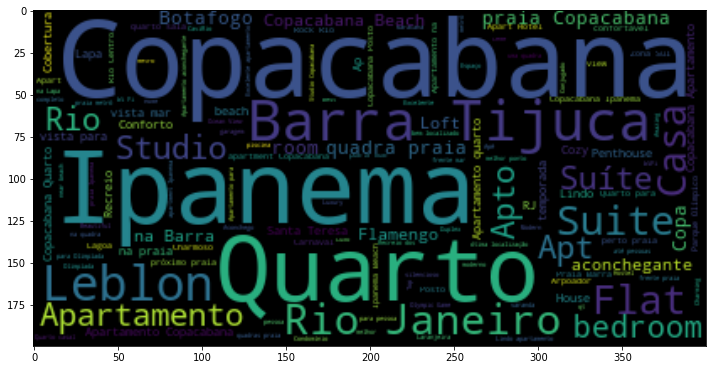

In [ ]:
# gerar uma wordcloud
wordcloud = WordCloud(stopwords=stopwords,
                      background_color="black").generate(all_names)

# mostrar a imagem final
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(wordcloud, interpolation='bilinear')

plt.tight_layout()

In [ ]:
#wordcloud.to_file("airbnb_summary_wordcloud.png",) -- caso queira salvar


## Folium

In [ ]:
location = (df.latitude.mean(), df.longitude.mean())
map_rj = folium.Map(location=location, zoom_start=11)

In [ ]:
map_rj

In [ ]:
for each in df.iterrows():
  folium.Marker(
          location = [each[1]['latitude'],each[1]['longitude']],
          #popup = "price: "+str(each[1]['price'])
          ).add_to(map_rj)

In [ ]:
map_rj